In [2]:
# Import all the necessary modules
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.ticker as ticker
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas_datareader as pdr
import math
import datetime
import itertools
import yfinance as yf
import seaborn as sn
from IPython.display import display, HTML
from trend_following import (apply_jupyter_fullscreen_css, load_financial_data, get_returns_volatility, calculate_slope, trend_signal, slope_signal, 
                             create_trend_strategy, get_close_prices, calculate_donchian_channels)
from strategy_performance_metrics import (calculate_sharpe_ratio, calculate_calmar_ratio, calculate_CAGR, calculate_risk_and_performance_metrics,
                                          calculate_compounded_cumulative_returns, estimate_fee_per_trade, rolling_sharpe_ratio)
import coinbase_utils as cn
import strategy_performance_metrics as perf
import trend_following as tf
%matplotlib inline

In [3]:
import importlib
importlib.reload(cn)
importlib.reload(perf)
importlib.reload(tf)

<module 'trend_following' from '/Users/adheerchauhan/Documents/git/trend_following/trend_following.py'>

In [6]:
import warnings
warnings.filterwarnings('ignore')
pd.set_option('Display.max_rows', None)
pd.set_option('Display.max_columns',None)
apply_jupyter_fullscreen_css()

In [14]:
## Trend Following Strategy with Moving Average Crossovers and Donchian Channels
def generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, moving_avg_type='exponential', price_or_returns_calc='returns',
                                                rolling_donchian_window=20, include_signal_strength=True, long_only=False, use_coinbase_data=True):
    
    # Generate Trend Signal
    if use_coinbase_data:
        # df = cn.get_coinbase_ohlc_data(ticker=ticker)
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date, 
                                                            end_date=end_date, save_to_file=False)
        df = (df[['close']].rename(columns={'close':ticker}))
        df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    else:
        df = get_close_prices(start_date, end_date, ticker, print_status=False)
    df_trend = (create_trend_strategy(df, ticker, mavg_start=fast_mavg, mavg_end=slow_mavg, mavg_stepsize=mavg_stepsize, slope_window=10, moving_avg_type=moving_avg_type,
                                      price_or_returns_calc=price_or_returns_calc)
                .rename(columns={f'{ticker}_trend_strategy_returns': f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}',
                                 f'{ticker}_trend_strategy_trades': f'{ticker}_trend_strategy_trades_{fast_mavg}_{mavg_stepsize}_{slow_mavg}'}))
    # Generate Donchian Signal
    df_donchian = generate_donchian_channels(start_date=start_date, end_date=end_date, ticker=ticker, price_or_returns_calc=price_or_returns_calc,
                                             rolling_donchian_window=rolling_donchian_window, use_coinbase_data=use_coinbase_data)
    if price_or_returns_calc == 'price':

        # Buy signal: Price crosses above upper band
        df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
            (df_donchian[f'close'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_price']), 1,
            np.where((df_donchian[f'close'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_price']), -1, 0))
    elif price_or_returns_calc == 'returns':
        df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_signal'] = np.where(
            (df_donchian[f'{ticker}_pct_returns'] > df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_returns']), 1,
            np.where((df_donchian[f'{ticker}_pct_returns'] < df_donchian[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_returns']), -1, 0))

    # Merging the Trend and donchian Dataframes
    donchian_cols = [f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}',
                     f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}', f'{ticker}_{rolling_donchian_window}_donchian_signal']
    df_trend = pd.merge(df_trend, df_donchian[donchian_cols], left_index=True, right_index=True, how='left')
    
    if include_signal_strength:
        # Calculate the strength of moving average crossover and donchian signal
        df_trend[f'{ticker}_donchian_band_width_{price_or_returns_calc}'] = (df_trend[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] -
                                                                            df_trend[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'])
        donchian_strength = (np.abs(df_trend[f'{ticker}'] - df_trend[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}']) /
                            df_trend[f'{ticker}_donchian_band_width_{price_or_returns_calc}'])
        crossover_strength = np.abs(df_trend[f'{ticker}_{fast_mavg}_mavg'] - df_trend[f'{ticker}_{slow_mavg}_mavg']) / df_trend[f'{ticker}']

        df_trend[f'{ticker}_crossover_donchian_signal_strength'] = (donchian_strength + crossover_strength) / 2
        strength_threshold = 0.5
    
        # Moving Average and Donchian Channel Signal
        buy_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1) &
                      (df_trend[f'{ticker}_trend_signal'] == 1) &
                      (df_trend[f'{ticker}_crossover_donchian_signal_strength'] > strength_threshold))
        sell_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1) &
                       (df_trend[f'{ticker}_trend_signal'] == -1) &
                       ((df_trend[f'{ticker}_crossover_donchian_signal_strength'] > strength_threshold)))
    else:
        # Moving Average and Donchian Channel Signal
        buy_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == 1) &
                      (df_trend[f'{ticker}_trend_signal'] == 1))
        sell_signal = ((df_trend[f'{ticker}_{rolling_donchian_window}_donchian_signal'] == -1) &
                       (df_trend[f'{ticker}_trend_signal'] == -1))
    
    if long_only:
        df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'] = (
            np.where(buy_signal, 1, 0))
    else:
        df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'] = (
            np.where(buy_signal, 1, np.where(sell_signal, -1, 0)))
        
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal')] * 
        df_trend[f'{ticker}_pct_returns'])
    df_trend[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'] = (
        df_trend[(f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal')].diff())
    
    return df_trend

def generate_donchian_channels(start_date, end_date, ticker, price_or_returns_calc='price',
                               rolling_donchian_window=20, use_coinbase_data=True):
    if use_coinbase_data:
        # df = cn.get_coinbase_ohlc_data(ticker=ticker)
        # df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
        df = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date, 
                                                            end_date=end_date, save_to_file=False)
        # df = (df[['close']].rename(columns={'close':ticker}))
        df = df[(df.index.get_level_values('date') >= start_date) & (df.index.get_level_values('date') <= end_date)]
    else:
        df = load_financial_data(start_date, end_date, ticker, print_status=False)  # .shift(1)
        df.columns = ['open', 'high', 'low', 'close', 'adjclose', 'volume']

    if price_or_returns_calc == 'price':
        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = (
            df[f'close'].rolling(window=rolling_donchian_window).max())

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = (
            df[f'close'].rolling(window=rolling_donchian_window).min())

    elif price_or_returns_calc == 'returns':
        # Calculate Percent Returns
        df[f'{ticker}_pct_returns'] = df[f'close'].pct_change()

        # Rolling maximum of returns (upper channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).max()

        # Rolling minimum of returns (lower channel)
        df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'] = df[
            f'{ticker}_pct_returns'].rolling(window=rolling_donchian_window).min()

    # Middle of the channel (optional, could be just average of upper and lower)
    df[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}'] = (
            (df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'] +
             df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']) / 2)

    # Shift only the Keltner channel metrics to avoid look-ahead bias
    df[[f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']] = df[[
        f'{ticker}_{rolling_donchian_window}_donchian_middle_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}',
        f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}']].shift(1)

    return df

In [16]:
def plot_trend_following_performance(df, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, rolling_sharpe_window):
    
    start_date = pd.to_datetime(start_date).date().strftime('%Y-%m-%d')
    end_date = pd.to_datetime(end_date).date().strftime('%Y-%m-%d')
    fig = plt.figure(figsize=(22,20))
    layout = (5,2)
    trend_ax = plt.subplot2grid(layout, (0,0), colspan=2)
    trend_donchian_ax = plt.subplot2grid(layout, (1,0), colspan=2)
    trend_signal_ax = plt.subplot2grid(layout, (2,0), colspan=2)
    trend_rolling_sharpe_ax = plt.subplot2grid(layout, (3,0), colspan=2)
    trend_return_ax = plt.subplot2grid(layout, (4,0))#, colspan=2)
    trend_cum_return_ax = plt.subplot2grid(layout, (4,1))#, colspan=2)

    if price_or_returns_calc == 'price':
        _ = trend_ax.plot(df.index, df[f'{ticker}'], label='Price')
    elif price_or_returns_calc == 'returns':
        _ = trend_ax.plot(df.index, df[f'{ticker}_pct_returns'], label='Returns')
    for mavg in np.linspace(fast_mavg, slow_mavg, mavg_stepsize):
        _ = trend_ax.plot(df.index, df[f'{ticker}_{int(mavg)}_mavg'], label=f'{mavg} M Avg')

    _ = trend_ax.set_title(f'{ticker} Moving Average Ribbons - {start_date} - {end_date}')
    _ = trend_ax.set_ylabel('Price')
    _ = trend_ax.set_xlabel('Date')
    _ = trend_ax.legend()
    _ = trend_ax.grid()

    if price_or_returns_calc == 'price':
        _ = trend_donchian_ax.plot(df.index, df[f'{ticker}'], label='Price')
    elif price_or_returns_calc == 'returns':
        _ = trend_donchian_ax.plot(df.index, df[f'{ticker}_pct_returns'], label='Returns')
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_upper_band_{price_or_returns_calc}'], label='Donchian Upper Band', linestyle='--', linewidth=3)
    _ = trend_donchian_ax.plot(df.index,
                      df[f'{ticker}_{rolling_donchian_window}_donchian_lower_band_{price_or_returns_calc}'], label='Donchian Lower Band', linestyle='--', linewidth=3)

    _ = trend_donchian_ax.set_title(f'{ticker} Donchian Channels')
    _ = trend_donchian_ax.set_ylabel('Price')
    _ = trend_donchian_ax.set_xlabel('Date')
    _ = trend_donchian_ax.legend()
    _ = trend_donchian_ax.grid()

    _ = trend_signal_ax.plot(df.index,
                             df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_signal'], label='Signal')
    _ = trend_signal_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Signal')
    _ = trend_signal_ax.set_ylabel('Signal')
    _ = trend_signal_ax.set_xlabel('Date')
    _ = trend_signal_ax.legend()
    _ = trend_signal_ax.grid()

    _ = trend_rolling_sharpe_ax.plot(df.index,
                                     df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'],
                                     label='Sharpe Ratio', color='orange')
    _ = trend_rolling_sharpe_ax.set_title(f'{ticker} Rolling Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_ylabel('Sharpe Ratio')
    _ = trend_rolling_sharpe_ax.set_xlabel('Date')
    _ = trend_rolling_sharpe_ax.legend()
    _ = trend_rolling_sharpe_ax.grid()

    _ = trend_return_ax.plot(df.index,
                             df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'],
                             label='Return')
    _ = trend_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Return')
    _ = trend_return_ax.set_ylabel('Return')
    _ = trend_return_ax.set_xlabel('Date')
    _ = trend_return_ax.legend()
    _ = trend_return_ax.grid()

    # _ = trend_cum_return_ax.plot(df_trend_mavg_donchian.index, df_trend_mavg_donchian[f'{ticker}_trend_strategy_returns_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_cum'], label='Cum. Return')
    _ = trend_cum_return_ax.plot(df.index, df['strategy_cumulative_return'], label='Cum. Return')
    _ = trend_cum_return_ax.set_title(f'{ticker} Trend Strategy with Donchian Channel Cumulative Return')
    _ = trend_cum_return_ax.set_ylabel('Cum. Return')
    _ = trend_cum_return_ax.set_xlabel('Date')
    _ = trend_cum_return_ax.legend()
    _ = trend_cum_return_ax.grid()


    plt.tight_layout()
    
    return

def get_trend_following_strategy_performance(start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, rolling_donchian_window, rolling_sharpe_window, long_only=False,
                                             include_transaction_costs_and_fees=True, transaction_cost_est=0.001, passive_trade_rate=0.5, use_coinbase_data=True):
    price_or_returns_calc = 'price'
    df = generate_trend_signal_with_donchian_channel(start_date, end_date, ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                     mavg_stepsize=mavg_stepsize, price_or_returns_calc=price_or_returns_calc, rolling_donchian_window=rolling_donchian_window,
                                                     include_signal_strength=False, long_only=long_only, use_coinbase_data=use_coinbase_data)
    if include_transaction_costs_and_fees:
        average_fee_per_trade = estimate_fee_per_trade(passive_trade_rate=passive_trade_rate)
        adjusted_daily_returns = df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns'] - (
            np.abs(df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades']) * (transaction_cost_est + average_fee_per_trade))
        df['strategy_cumulative_return'] = (1 + adjusted_daily_returns).cumprod() - 1
    else:
        df['strategy_cumulative_return'] = (1 + df[f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns']).cumprod() - 1

    df[f'rolling_sharpe_{rolling_sharpe_window}'] = (perf.rolling_sharpe_ratio(df, window=rolling_sharpe_window, 
    strategy_daily_return_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_returns',
    strategy_trade_count_col=f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_trades'))
    df = df.rename(
        columns={f'rolling_sharpe_{rolling_sharpe_window}': f'{ticker}_{fast_mavg}_{mavg_stepsize}_{slow_mavg}_mavg_crossover_{rolling_donchian_window}_donchian_strategy_rolling_sharpe_{rolling_sharpe_window}'})
    
    plot_trend_following_performance(df, start_date, end_date, ticker, fast_mavg, slow_mavg, mavg_stepsize, price_or_returns_calc, rolling_donchian_window, rolling_sharpe_window)
    
    return df

In [18]:
## Strategy Parameters
fast_mavg = 50
slow_mavg = 250
mavg_stepsize = 6
rolling_donchian_window = 20

BTC-USD
ETH-USD
SOL-USD
LTC-USD
DOGE-USD
CRO-USD
ADA-USD
AVAX-USD
XRP-USD
SHIB-USD
LINK-USD
UNI-USD


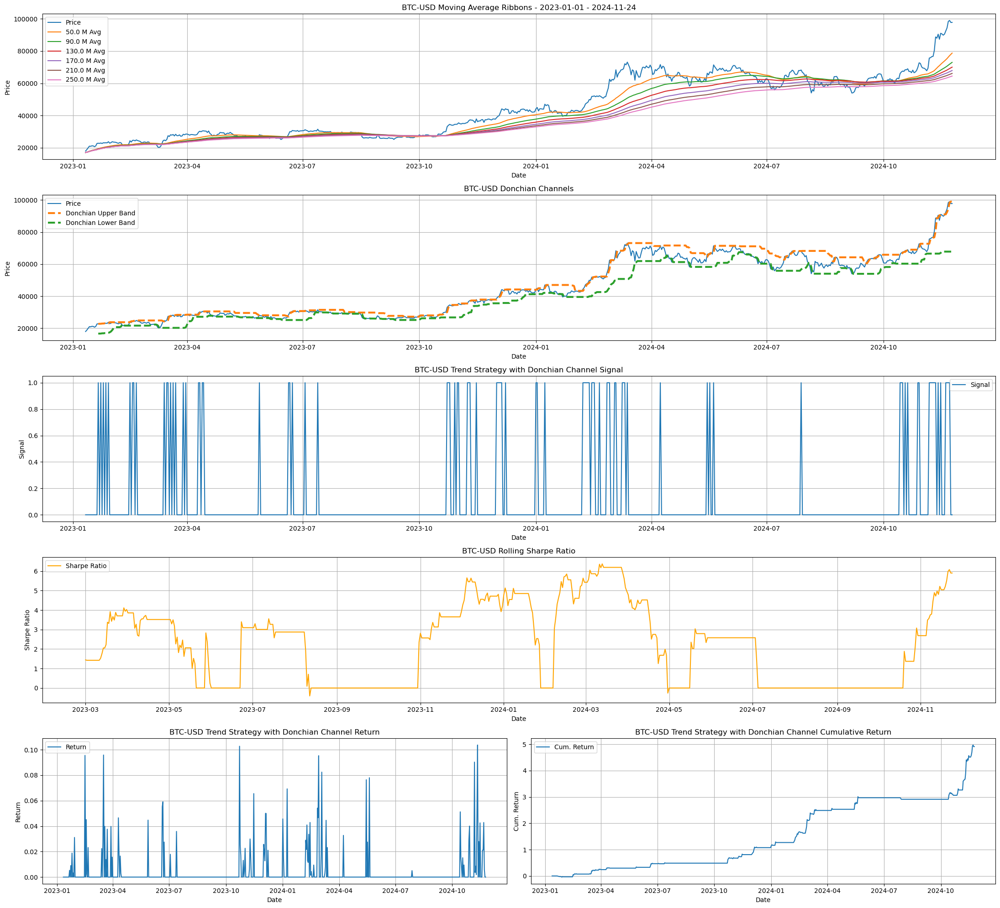

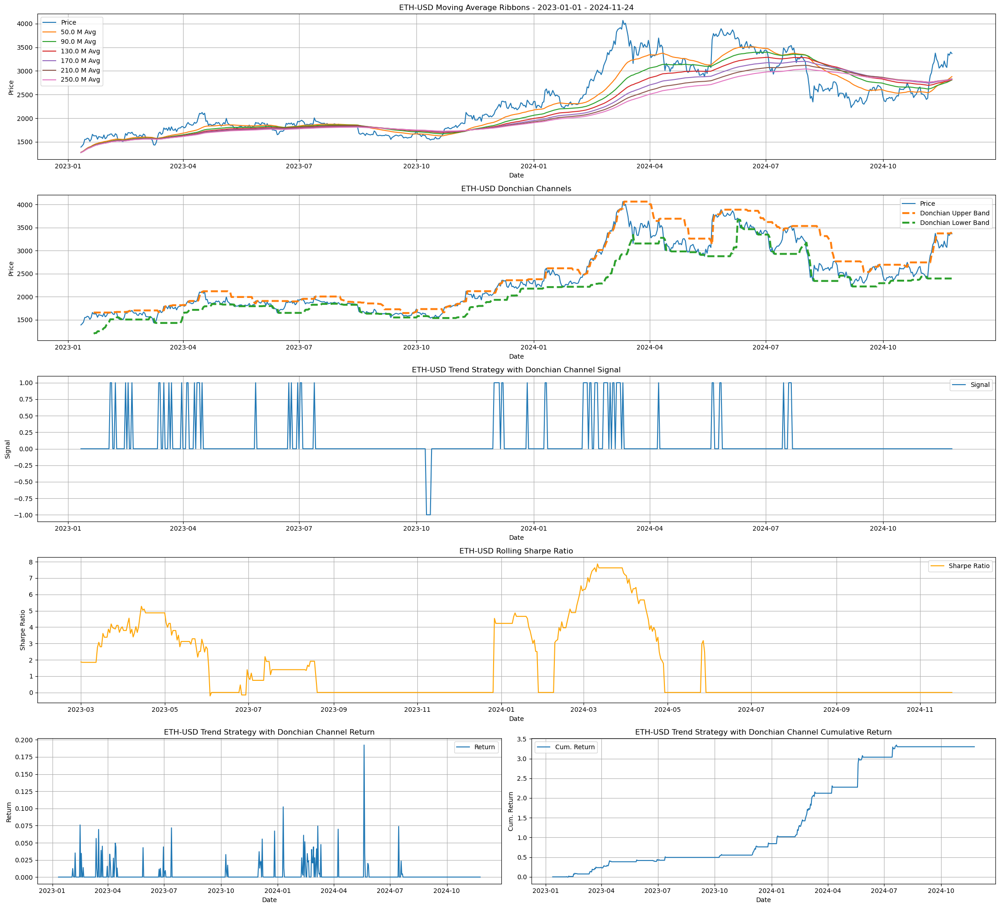

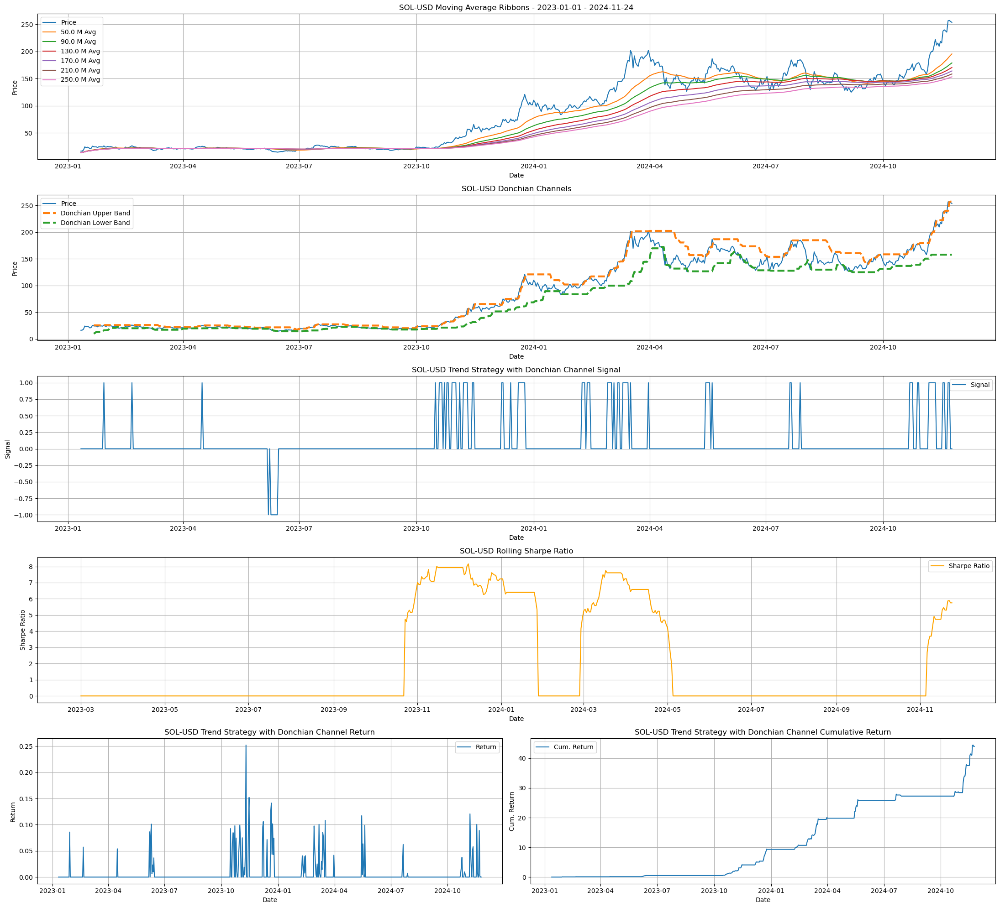

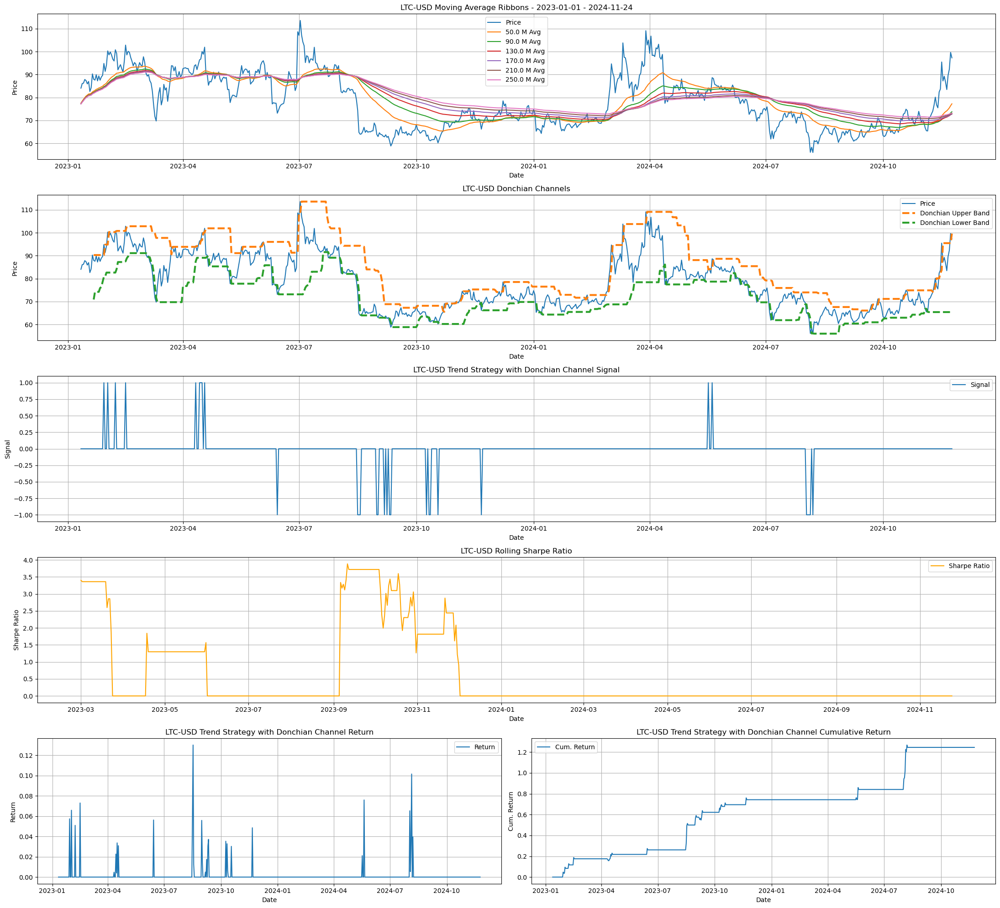

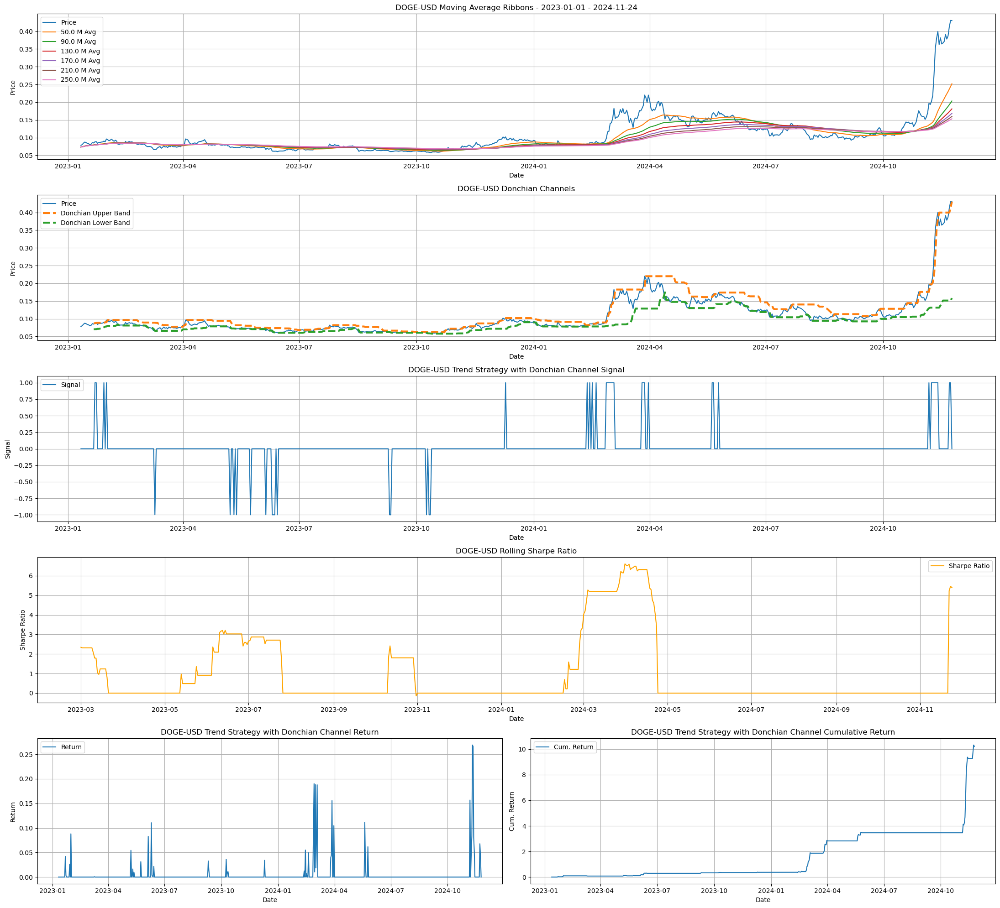

...

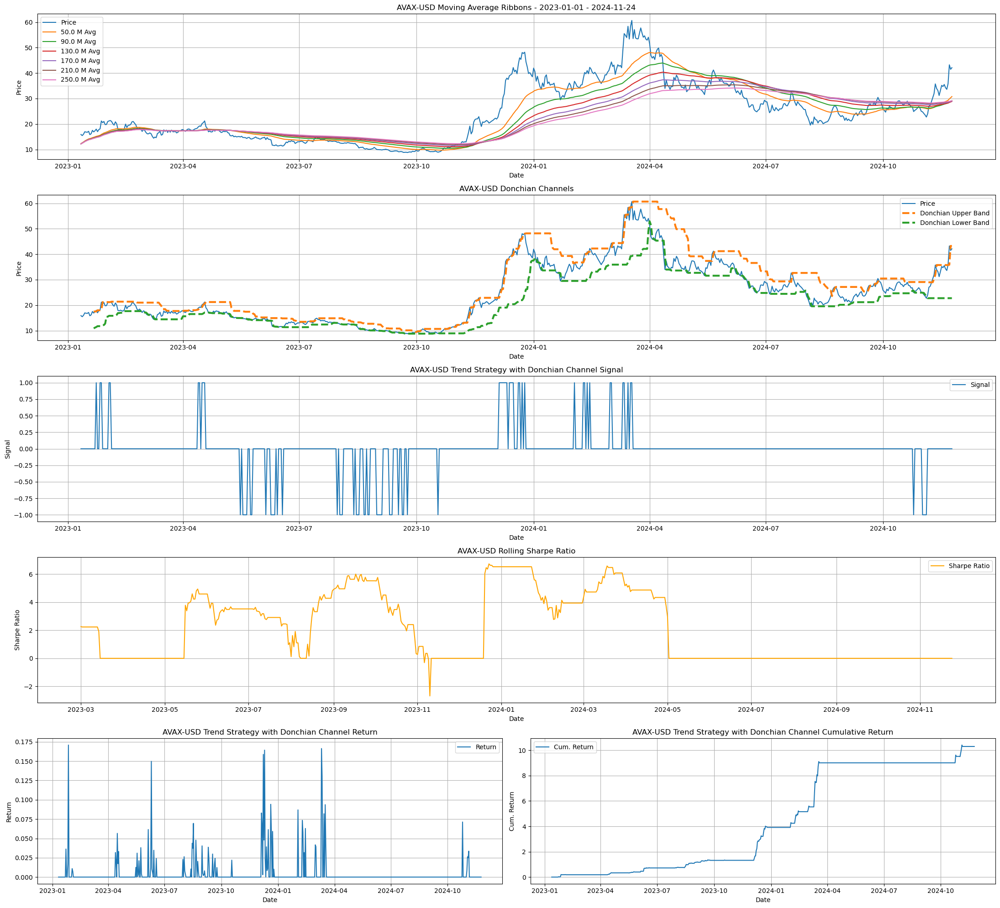

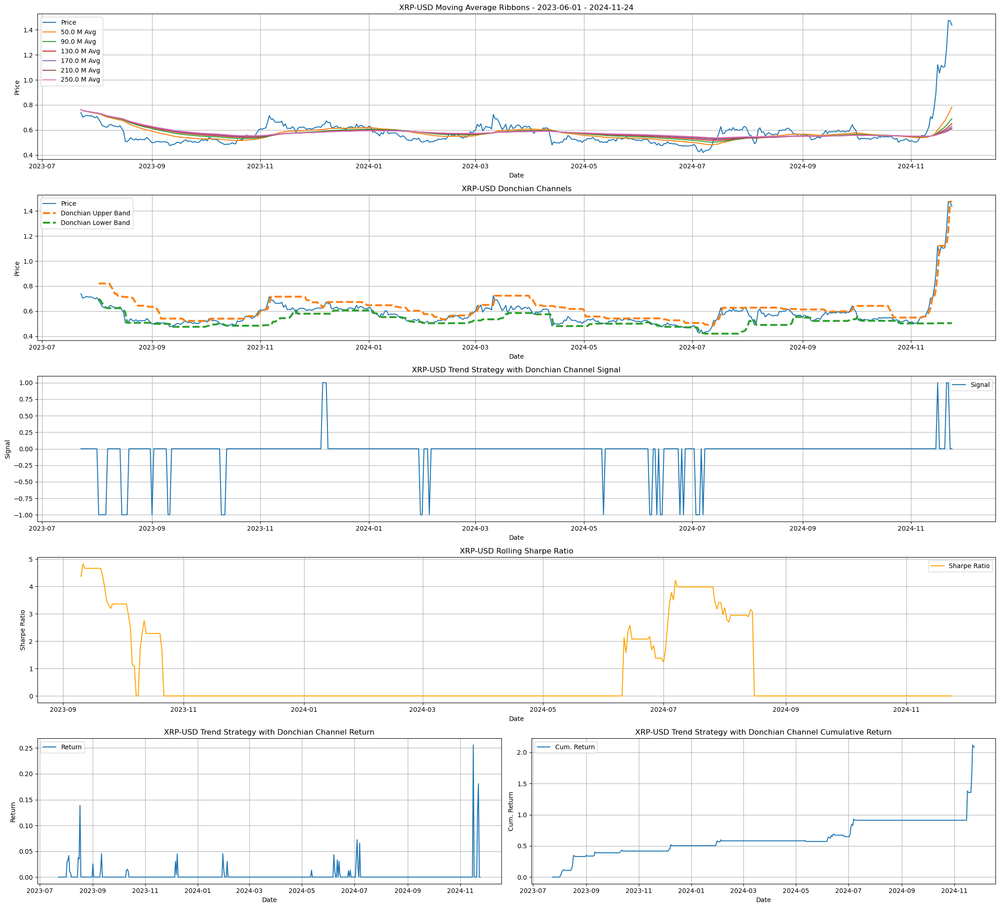

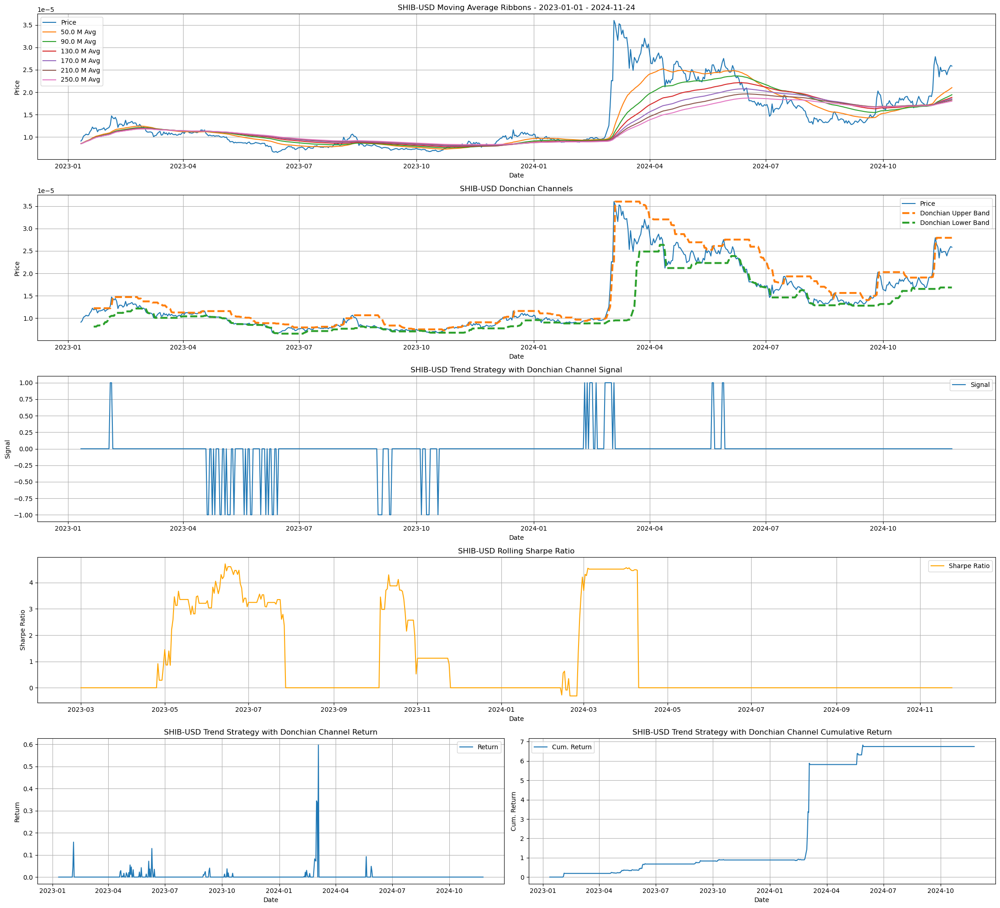

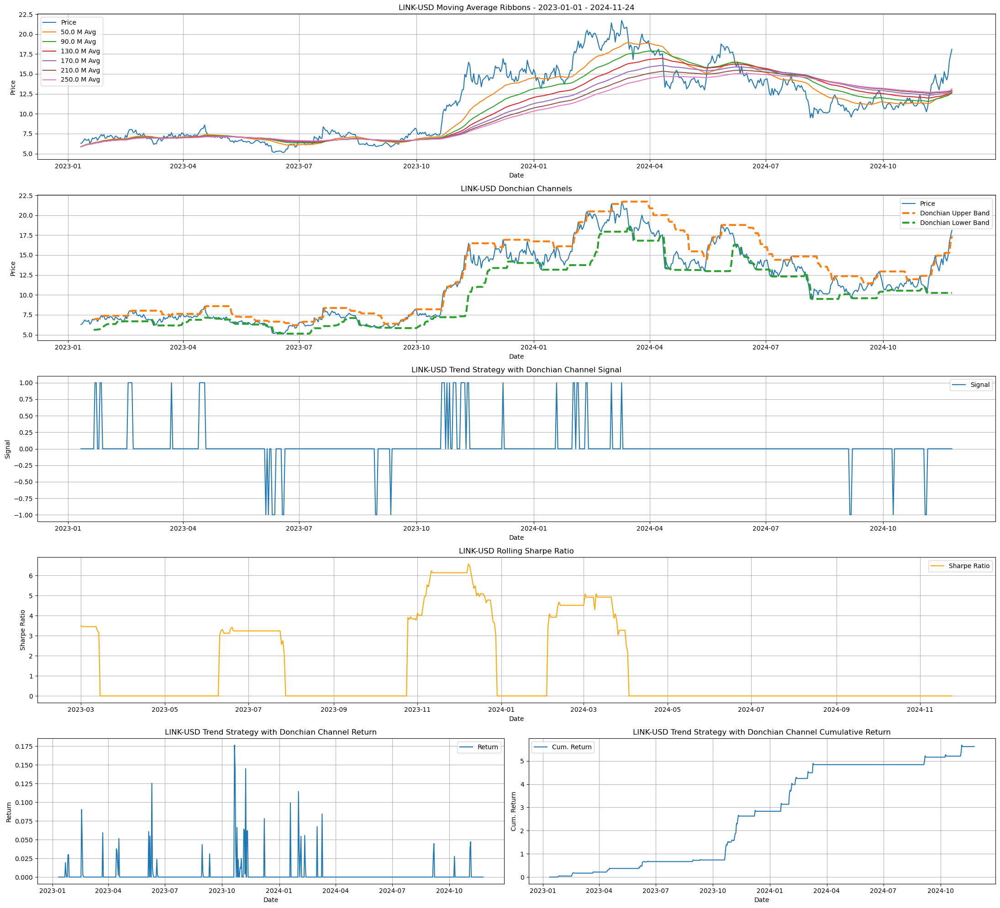

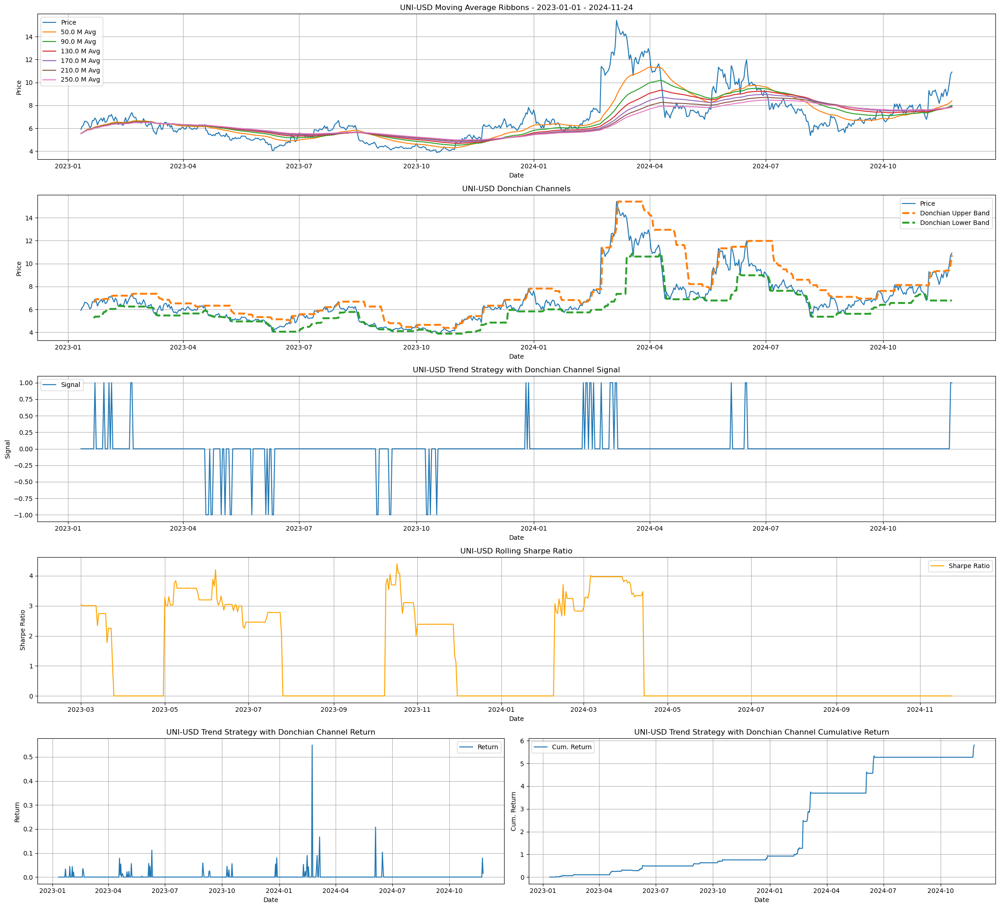

In [35]:
trend_df_dict = {}
ticker_list = ['BTC-USD','ETH-USD','SOL-USD','LTC-USD','DOGE-USD','CRO-USD','ADA-USD','AVAX-USD','XRP-USD','SHIB-USD','LINK-USD','UNI-USD']
start_date_dict = cn.coinbase_start_date_by_ticker_dict
start_date = '2023-01-01'
end_date = datetime.datetime.now().date()#.strftime('%Y-%m-%d')
for ticker in ticker_list:
    print(ticker)
    if ticker == 'XRP-USD':
        _df_trend = get_trend_following_strategy_performance(start_date=pd.to_datetime(start_date_dict[ticker]).date(), end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                             mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window, rolling_sharpe_window=50)
    else:
        _df_trend = get_trend_following_strategy_performance(start_date=pd.to_datetime(start_date).date(), end_date=end_date, ticker=ticker, fast_mavg=fast_mavg, slow_mavg=slow_mavg,
                                                         mavg_stepsize=mavg_stepsize, rolling_donchian_window=rolling_donchian_window, rolling_sharpe_window=50)
    trend_df_dict[ticker] = _df_trend

## Coinbase Portfolio Analysis

In [56]:
portfolio_cols = ['asset','allocation']
df_portfolio = cn.get_portfolio_breakdown(cn.get_coinbase_rest_api_client(cn.key_location))
df_portfolio_trim = df_portfolio[portfolio_cols].reset_index(drop=True)
df_portfolio_trim['asset'] = df_portfolio_trim['asset'].apply(lambda x: f"{x}-USD")

## Coinbase Ticker List
coinbase_ticker_list = list(cn.coinbase_start_date_by_ticker_dict.keys())
df_portfolio_trim = df_portfolio_trim[df_portfolio_trim.asset.isin(coinbase_ticker_list)].reset_index(drop=True)

In [62]:
df_portfolio_trim.allocation.sum()

0.9980899673179998

In [ ]:
df_start_date = pd.DataFrame(start_date_dict.items(), columns=['asset','start_date'])
df_portfolio_trim = pd.merge(df_portfolio_trim, df_start_date, left_on='asset', right_on='asset', how='left')

In [ ]:
df_portfolio_trim.sort_values('allocation', ascending=False).reset_index(drop=True)

In [ ]:
start_date_dict = {
    # 'BTC-USD': '2016-01-01',
    # 'ETH-USD': '2016-05-01',
    'BTC-USD': '2022-01-01',
    'ETH-USD': '2022-01-01',
    'SOL-USD': '2022-01-01',
    'LTC-USD': '2022-01-01',
    'DOGE-USD': '2022-01-01',
    'CRO-USD': '2022-01-01',
    'ADA-USD': '2022-01-01',
    'AVAX-USD': '2022-01-01',
    'XRP-USD': '2023-06-01',
    'SHIB-USD': '2022-01-01',
    'LINK-USD': '2022-01-01',
    'UNI-USD': '2022-01-01',
}

In [122]:
ticker_list = df_portfolio_trim.asset.unique().tolist()
daily_portfolio_dict = {}
start_date = max(cn.coinbase_start_date_by_ticker_dict.values())
for ticker in ticker_list:
    # start_date = pd.to_datetime(cn.coinbase_start_date_by_ticker_dict[ticker]).date()
    df_portfolio_daily_position = cn.save_historical_crypto_prices_from_coinbase(ticker=ticker, user_start_date=True, start_date=start_date,
                                                                                 end_date=end_date, save_to_file=False)
    df_portfolio_daily_position = (df_portfolio_daily_position[['close']]
                                   .rename(columns={'close':f'{ticker}_close'}))
    # df_portfolio_daily_position = df_portfolio_daily_position[((df_portfolio_daily_position.index.get_level_values('date') >= start_date) &
    #                                                            (df_portfolio_daily_position.index.get_level_values('date') <= end_date))]
    df_portfolio_daily_position[f'{ticker}_position'] = df_portfolio_trim[df_portfolio_trim.asset == ticker].allocation.values[0]
    df_portfolio_daily_position[f'{ticker}_portfolio_value'] = df_portfolio_daily_position[f'{ticker}_close'] * df_portfolio_daily_position[f'{ticker}_position']
    df_portfolio_daily_position[f'{ticker}_pct_returns'] = df_portfolio_daily_position[f'{ticker}_portfolio_value'].pct_change()
    daily_portfolio_dict[ticker] = df_portfolio_daily_position

In [128]:
df_portfolio_daily = pd.concat(daily_portfolio_dict, axis=1)
## Assign new column names to the dataframe
df_portfolio_daily.columns = df_portfolio_daily.columns.to_flat_index()
cols = []
for ticker in ticker_list:
    trend_cols = [f'{ticker}_close',f'{ticker}_position',f'{ticker}_portfolio_value',f'{ticker}_pct_returns']
    cols.append(trend_cols)
cols = [item for sublist in cols for item in sublist]
df_portfolio_daily.columns = cols

## Total Portfolio Return
return_cols = [f'{ticker}_pct_returns' for ticker in ticker_list]
portfolio_value_cols = [f'{ticker}_portfolio_value' for ticker in ticker_list]
df_portfolio_daily['total_pct_returns'] = df_portfolio_daily[return_cols].sum(axis=1)
df_portfolio_daily['total_portfolio_value'] = df_portfolio_daily[portfolio_value_cols].sum(axis=1)

In [130]:
df_portfolio_daily

,AMP-USD_close,AMP-USD_position,AMP-USD_portfolio_value,AMP-USD_pct_returns,AVAX-USD_close,AVAX-USD_position,AVAX-USD_portfolio_value,AVAX-USD_pct_returns,GRT-USD_close,GRT-USD_position,GRT-USD_portfolio_value,GRT-USD_pct_returns,ALGO-USD_close,ALGO-USD_position,ALGO-USD_portfolio_value,ALGO-USD_pct_returns,MATIC-USD_close,MATIC-USD_position,MATIC-USD_portfolio_value,MATIC-USD_pct_returns,KRL-USD_close,KRL-USD_position,KRL-USD_portfolio_value,KRL-USD_pct_returns,ETH-USD_close,ETH-USD_position,ETH-USD_portfolio_value,ETH-USD_pct_returns,ATOM-USD_close,ATOM-USD_position,ATOM-USD_portfolio_value,ATOM-USD_pct_returns,AAVE-USD_close,AAVE-USD_position,AAVE-USD_portfolio_value,AAVE-USD_pct_returns,SHIB-USD_close,SHIB-USD_position,SHIB-USD_portfolio_value,SHIB-USD_pct_returns,SKL-USD_close,SKL-USD_position,SKL-USD_portfolio_value,SKL-USD_pct_returns,FET-USD_close,FET-USD_position,FET-USD_portfolio_value,FET-USD_pct_returns,DOT-USD_close,DOT-USD_position,DOT-USD_portfolio_value,DOT-USD_pct_returns,DOGE-USD_close,DOGE-USD_position,DOGE-USD_portfolio_value,DOGE-USD_pct_returns,OXT-USD_close,OXT-USD_position,OXT-USD_portfolio_value,OXT-USD_pct_returns,LTC-USD_close,LTC-USD_position,LTC-USD_portfolio_value,LTC-USD_pct_returns,MANA-USD_close,MANA-USD_position,MANA-USD_portfolio_value,MANA-USD_pct_returns,ADA-USD_close,ADA-USD_position,ADA-USD_portfolio_value,ADA-USD_pct_returns,XLM-USD_close,XLM-USD_position,XLM-USD_portfolio_value,XLM-USD_pct_returns,DAI-USD_close,DAI-USD_position,DAI-USD_portfolio_value,DAI-USD_pct_returns,BTC-USD_close,BTC-USD_position,BTC-USD_portfolio_value,BTC-USD_pct_returns,SOL-USD_close,SOL-USD_position,SOL-USD_portfolio_value,SOL-USD_pct_returns,REQ-USD_close,REQ-USD_position,REQ-USD_portfolio_value,REQ-USD_pct_returns,total_pct_returns,total_portfolio_value
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-06-01,0.00255,0.001133,0.000003,NaN,14.10,0.01962,0.276639,NaN,0.1282,0.000028,0.000004,NaN,0.1483,0.019377,0.002874,NaN,0.8893,0.005622,0.005000,NaN,0.2567,0.001707,0.000438,NaN,1862.43,0.356562,664.072585,NaN,10.336,0.004258,0.044011,NaN,62.67,0.014823,0.928933,NaN,0.000008,0.00433,3.667501e-08,NaN,0.0330,0.000043,1.431557e-06,NaN,0.2627,0.022093,0.005804,NaN,5.207,0.024439,0.127256,NaN,0.07145,0.006265,0.000448,NaN,0.0651,0.003491,0.000227,NaN,94.23,0.008614,0.811717,NaN,0.4728,0.004593,0.002172,NaN,0.3645,0.051459,0.018757,NaN,0.091219,0.012063,0.001100,NaN,1.0000,0.014669,0.014669,NaN,26828.42,0.208727,5599.827158,NaN,20.51,0.213841,4.385870,NaN,0.0882,0.000332,0.000029,NaN,0.000000,6270.525695
2023-06-02,0.00265,0.001133,0.000003,0.039216,14.50,0.01962,0.284487,0.028369,0.1298,0.000028,0.000004,0.012480,0.1517,0.019377,0.002939,0.022927,0.8995,0.005622,0.005057,0.011470,0.2578,0.001707,0.000440,0.004285,1907.41,0.356562,680.110764,0.024151,10.659,0.004258,0.045387,0.031250,63.66,0.014823,0.943607,0.015797,0.000009,0.00433,3.728121e-08,0.016529,0.0348,0.000043,1.509642e-06,0.054545,0.2732,0.022093,0.006036,0.039970,5.279,0.024439,0.129015,0.013828,0.07258,0.006265,0.000455,0.015815,0.0662,0.003491,0.000231,0.016897,95.49,0.008614,0.822571,0.013372,0.4845,0.004593,0.002225,0.024746,0.3783,0.051459,0.019467,0.037860,0.092007,0.012063,0.001110,0.008639,0.9999,0.014669,0.014668,-0.000100,27250.69,0.208727,5687.966489,0.015740,21.27,0.213841,4.548389,0.037055,0.0896,0.000332,0.000030,0.015873,0.500713,6374.903376
2023-06-03,0.00255,0.001133,0.000003,-0.037736,14.58,0.01962,0.286057,0.005517,0.1286,0.000028,0.000004,-0.009245,0.1507,0.019377,0.002920,-0.006592,0.9001,0.005622,0.005061,0.000667,0.2597,0.001707,0.000443,0.007370,1892.62,0.356562,674.837205,-0.007754,10.704,0.004258,0.045578,0.004222,63.62,0.014823,0.943014,-0.000628,0.000009,0.00433,3.723791e-08,-0.001161,0.0340,0.000043,1.474937e-06,-0.022989,0.2688,0.022093,0.005939,-0.016105,5.341,0.024439,0.130531,0.011745,0.07271,0.006265,0.000455,0.001791,0.0657,0.003491,0.000229,-0.007553,96.04,0.008614,

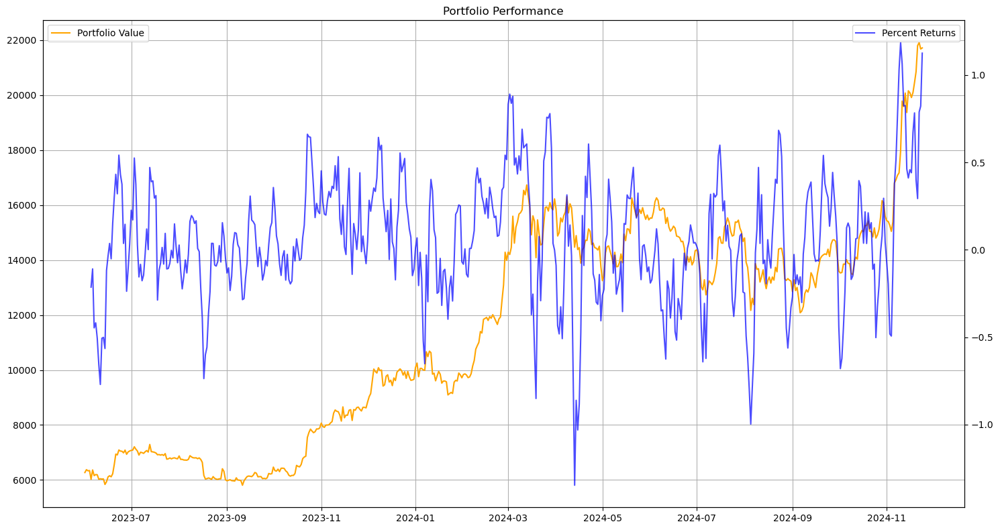

In [144]:
fig = plt.figure(figsize=(15,8))
layout = (1,1)
strategy_perf_ax = plt.subplot2grid(layout, (0,0))#, colspan=2)
strategy_perf_ax2 = strategy_perf_ax.twinx()
# strategy_target_position_ax = plt.subplot2grid(layout, (1,0))#, colspan=2)
# sharpe_ax = plt.subplot2grid(layout, (2,0))

_ = strategy_perf_ax.plot(df_portfolio_daily.index, df_portfolio_daily[f'total_portfolio_value'], label=f'Portfolio Value', color='orange')
_ = strategy_perf_ax2.plot(df_portfolio_daily.index, df_portfolio_daily[f'total_pct_returns'].rolling(5).mean(), label=f'Percent Returns', color='blue', alpha=0.7)
# _ = strategy_target_position_ax.plot(df_strategy_std.index, df_strategy_std[f'{ticker}_vol_scaled_target_notional'], label=f'{ticker} Target Position', color='orange')
# _ = sharpe_ax.plot(df_strategy_std.index, df_strategy_std[f'{ticker}_rolling_sharpe_ratio_50d'], label=f'{ticker} 50d Rolling Sharpe', color='magenta')

_ = strategy_perf_ax.grid()
_ = strategy_perf_ax.legend(loc='upper left')
_ = strategy_perf_ax2.legend(loc='upper right')
_ = strategy_perf_ax.set_title(f'Portfolio Performance')

# _ = strategy_target_position_ax.grid()
# _ = strategy_target_position_ax.legend(loc='upper left')
# _ = strategy_target_position_ax.set_title(f'{ticker} Target Position Size')

# _ = sharpe_ax.grid()
# _ = sharpe_ax.legend(loc='upper left')
# _ = sharpe_ax.set_title(f'{ticker} Rolling Sharpe Ratio')

plt.tight_layout()

# # Calculate overall Sharpe Ratio (assuming risk-free rate = 0)
# annualization_factor = 365  # number of trading days in a year
# sharpe_ratio = (df_strategy['strategy_pct_returns'].mean() * annualization_factor) / (df_strategy['strategy_pct_returns'].std() * np.sqrt(annualization_factor))
# print(f"{ticker} Overall Sharpe Ratio:", sharpe_ratio)